In [12]:
!pip install opencv-python

   ---------------------------------------- 0.0/38.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/38.6 MB 960.0 kB/s eta 0:00:41
   ---------------------------------------- 0.1/38.6 MB 1.7 MB/s eta 0:00:23
   ---------------------------------------- 0.3/38.6 MB 2.4 MB/s eta 0:00:17
    --------------------------------------- 0.5/38.6 MB 3.0 MB/s eta 0:00:13
   - -------------------------------------- 1.0/38.6 MB 4.4 MB/s eta 0:00:09
   - -------------------------------------- 1.5/38.6 MB 5.3 MB/s eta 0:00:08
   -- ------------------------------------- 2.1/38.6 MB 6.2 MB/s eta 0:00:06
   -- ------------------------------------- 2.6/38.6 MB 6.9 MB/s eta 0:00:06
   --- ------------------------------------ 3.2/38.6 MB 7.8 MB/s eta 0:00:05
   --- ------------------------------------ 3.7/38.6 MB 8.1 MB/s eta 0:00:05
   ---- ----------------------------------- 4.3/38.6 MB 8.5 MB/s eta 0:00:05
   ---- ----------------------------------- 4.8/38.6 MB 8.8 MB/s eta 0:00:04
   -

In [100]:
!pip uninstall matplotlib

In [104]:
!pip install matplotlib==3.5.0 --user

  Using cached matplotlib-3.5.0-cp310-cp310-win_amd64.whl.metadata (6.7 kB)
Using cached matplotlib-3.5.0-cp310-cp310-win_amd64.whl (7.2 MB)


In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import cv2

In [2]:
import seaborn as sns

In [4]:
from tensorflow import keras
from keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing import image_dataset_from_directory

from sklearn.model_selection import train_test_split

In [7]:
from tensorflow.keras.optimizers import Adam
from keras.models import Model

In [9]:
import os
import matplotlib.image as mpimg

In [375]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, precision_recall_curve, auc, precision_score, recall_score

In [13]:
import keras
from keras.applications import VGG16, VGG19, ResNet50, EfficientNetB0, ConvNeXtTiny, InceptionV3, MobileNet

In [342]:
tf.random.set_seed(100)

In [15]:
!pip install opendatasets

In [17]:
import opendatasets as od

In [40]:
od.download("https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  nikitapudov


Your Kaggle Key:

  ········


Dataset URL: https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia


100%|█████████████████████████████████████████████████████████████████████████████| 2.29G/2.29G [03:37<00:00, 11.4MB/s]


In [19]:
path = "chest-xray-pneumonia/chest_xray/train"
classes = os.listdir(path)
print(classes)

['NORMAL', 'PNEUMONIA']


In [21]:
# Определим директории для X-ray изображений
PNEUMONIA_dir = os.path.join(path + "/" + classes[1])
NORMAL_dir = os.path.join(path + "/" + classes[0])

In [23]:
PNEUMONIA_dir

'chest-xray-pneumonia/chest_xray/train/PNEUMONIA'

In [25]:
# Создадим списки с именами файлов в каждой директории
pneumonia_names = os.listdir(PNEUMONIA_dir)
normal_names = os.listdir(NORMAL_dir)

In [27]:
print("Здесь ", len(pneumonia_names), "изображений с пневмонией в тренировочном наборе данных")
print("Здесь ", len(normal_names), "нормальных изображений в тренировочном наборе данных")

Здесь  3875 изображений с пневмонией в тренировочном наборе данных
Здесь  1341 нормальных изображений в тренировочном наборе данных


Выведем изображения с пневмонией

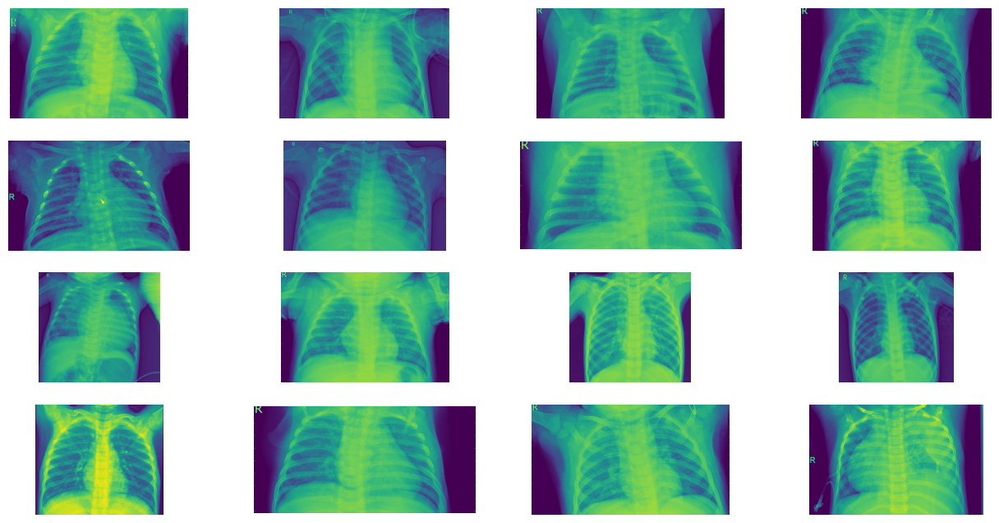

In [30]:
fig = plt.gcf()
fig.set_size_inches(16, 8)

#выбираем стартовый индекс изображения для отображения
pic_index = 210

# создаем список путей к файлам для отображения 16 изображений
pneumonia_images = [os.path.join(PNEUMONIA_dir, fname) for fname in pneumonia_names[pic_index - 8:pic_index + 8]]

for i, img_path in enumerate(pneumonia_images):
    sp = plt.subplot(4, 4, i + 1)
    sp.axis("Off")

    img = mpimg.imread(img_path)
    plt.imshow(img)

plt.show()

Аналогично выведем нормальные изображения

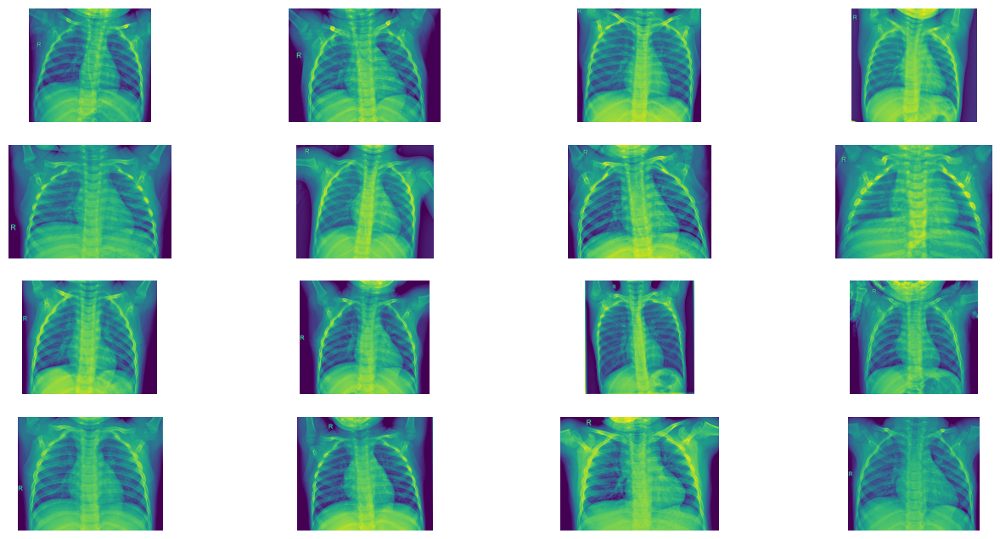

In [33]:
fig = plt.gcf()
fig.set_size_inches(16, 8)

#выбираем стартовый индекс изображения для отображения
pic_index = 210

# создаем список путей к файлам для отображения 16 изображений
normal_images = [os.path.join(NORMAL_dir, fname) for fname in normal_names[pic_index - 8:pic_index + 8]]

for i, img_path in enumerate(normal_images):
    sp = plt.subplot(4, 4, i + 1)
    sp.axis("Off")

    img = mpimg.imread(img_path)
    plt.imshow(img)

plt.show()

Подготовим тренировочные, тестовые и валидационные данные

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Путь к папкам с изображениями
normal_dir = "/content/chest-xray-pneumonia/chest_xray/train/NORMAL"
pneumonia_dir = "/content/chest-xray-pneumonia/chest_xray/train/PNEUMONIA"

# Функция для загрузки изображений из папок
def load_images_from_folder(folder, label):
    images = []
    labels = []
    for filename in os.listdir(folder):
        # Constructing the path of current image
        image_path = os.path.join(folder, filename)
         # Loading the image using OpenCV
        img = cv2.imread(image_path)
        img = cv2.resize(img, (224, 224))
        # Append the images to the image list
        images.append(img)
        # Append the labels
        labels.append(label)

        #img = load_img(os.path.join(folder, filename), target_size=(224, 224))
        #img_array = img_to_array(img)
        #images.append(img_array)
        #labels.append(label)
    return images, labels

In [ ]:
# Загрузка изображений и меток из папок
normal_images, normal_labels = load_images_from_folder(normal_dir, 0)
pneumonia_images, pneumonia_labels = load_images_from_folder(pneumonia_dir, 1)

# Объединение изображений и меток
images = np.array(normal_images + pneumonia_images)
labels = np.array(normal_labels + pneumonia_labels)

# Нормализация изображений
images = images / 255.0

In [ ]:
normal_images.clear()
pneumonia_images.clear()
normal_labels.clear()
pneumonia_labels.clear()

In [ ]:
images.shape

(5216, 224, 224, 3)

In [ ]:
labels.shape

(5216,)

In [ ]:
import os
import random
import shutil

# Пути к папкам NORMAL и PNEUMONIA
normal_dir = "/content/chest-xray-pneumonia/chest_xray/train/NORMAL"
pneumonia_dir = "/content/chest-xray-pneumonia/chest_xray/train/PNEUMONIA"

# Путь к папке для тестового набора данных
test_dir = "/content/data/test"

# Создаем папку для тестового набора данных, если она не существует
if not os.path.exists(test_dir):
    os.makedirs(test_dir)

# Создаем список всех файлов в папках NORMAL и PNEUMONIA
normal_files = [os.path.join(normal_dir, filename) for filename in os.listdir(normal_dir)]
pneumonia_files = [os.path.join(pneumonia_dir, filename) for filename in os.listdir(pneumonia_dir)]
all_files = normal_files + pneumonia_files

# Вычисляем количество файлов для тестового набора (10% от общего числа файлов)
num_test_files = int(0.1 * len(all_files))

# Выбираем случайные 10% файлов и перемещаем их в папку для тестового набора
test_files = random.sample(all_files, num_test_files)
for file_path in test_files:
    filename = os.path.basename(file_path)
    shutil.move(file_path, os.path.join(test_dir, filename))

print("Файлы были перемещены в папку для тестового набора данных:", test_dir)

Файлы были перемещены в папку для тестового набора данных: /content/data/test


In [ ]:
num_test_files

521

In [393]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Создаем генератор данных для тренировочного набора с разделением на валидационный и тренировочный
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.1  # указываем долю данных для валидации
)

test_datagen = ImageDataGenerator(
    rescale=1./255
)



# Создаем генераторы для тренировочного и валидационного наборов данных
train = train_datagen.flow_from_directory(
    directory="chest-xray-pneumonia/chest_xray/train",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'  # указываем подмножество для обучения
)

validation = train_datagen.flow_from_directory(
    directory="chest-xray-pneumonia/chest_xray/train",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'  # указываем подмножество для валидации
)

test = test_datagen.flow_from_directory(
    directory="chest-xray-pneumonia/chest_xray/test",
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

Found 4695 images belonging to 2 classes.
Found 521 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [ ]:
train = keras.utils.image_dataset_from_directory(
    directory="/content/chest-xray-pneumonia/chest_xray/train",
    labels="inferred",
    label_mode="categorical",
    batch_size=32,
    image_size=(224,224)
)

Found 5216 files belonging to 2 classes.


In [ ]:
test = keras.utils.image_dataset_from_directory(
    directory="/content/chest-xray-pneumonia/chest_xray/test",
    labels="inferred",
    label_mode="categorical",
    batch_size=32,
    image_size=(224,224)
)

Found 624 files belonging to 2 classes.


In [ ]:
validation = keras.utils.image_dataset_from_directory(
    directory="/content/chest-xray-pneumonia/chest_xray/val",
    labels="inferred",
    label_mode="categorical",
    batch_size=32,
    image_size=(224,224)
)

Found 16 files belonging to 2 classes.


#VGG16

In [395]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224,224,3), pooling="max", classifier_activation="softmax")

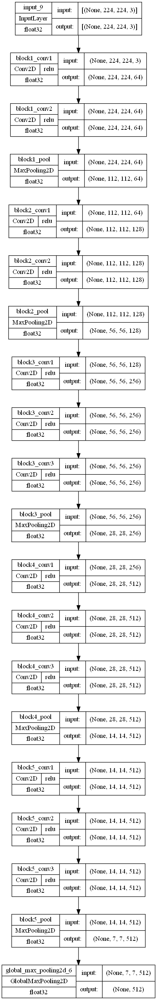

In [397]:
keras.utils.plot_model(
    base_model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

Создадим модель сверточной нейронной сети для классификации

In [400]:
for layer in base_model.layers:
    layer.trainable=False

In [402]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [404]:
model = Model(inputs=base_model.input, outputs=result)

In [20]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
#model.add(Dense(4096, activation='relu'))
#model.add(BatchNormalization())
#model.add(Dense(4096, activation='relu'))
#model.add(Dropout(0.1))
#model.add(BatchNormalization())
#model.add(Dense(1000, activation='relu'))
#model.add(Dropout(0.2))
#model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))
#model.add(Flatten())
#model.add(Dense(256, activation='relu'))
#model.add(Dropout(0.5))
#model.add(Dense(2, activation='sigmoid'))

In [406]:
model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

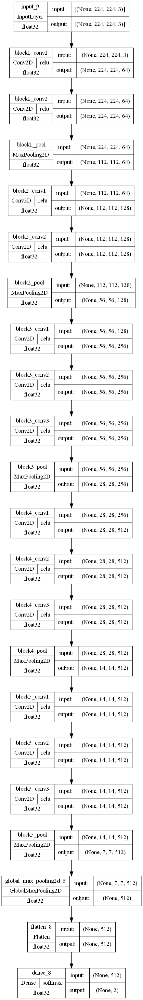

In [408]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [410]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [ ]:
from keras.utils import to_categorical

# Преобразование меток в формат one-hot encoding
train_labels = to_categorical(train_labels)
validation_labels = to_categorical(validation_labels)

In [ ]:
train_labels

array([[1., 0.],
       [0., 1.],
       [1., 0.],
       ...,
       [0., 1.],
       [0., 1.],
       [1., 0.]], dtype=float32)

In [412]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [414]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
# Создание коллбэка для отображения progress bar
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 61s 417ms/sample - loss: 0.3857 - accuracy: 0.8334 - precision_9: 0.8334 - recall_9: 0.8334 - val_loss: 0.2833 - val_accuracy: 0.8618 - val_precision_9: 0.8618 - val_recall_9: 0.8618
Epoch 2/10
147/147 [==============================] - 60s 405ms/sample - loss: 0.2343 - accuracy: 0.9118 - precision_9: 0.9118 - recall_9: 0.9118 - val_loss: 0.2322 - val_accuracy: 0.9060 - val_precision_9: 0.9060 - val_recall_9: 0.9060
Epoch 3/10
147/147 [==============================] - 59s 403ms/sample - loss: 0.2069 - accuracy: 0.9255 - precision_9: 0.9255 - recall_9: 0.9255 - val_loss: 0.2305 - val_accuracy: 0.9136 - val_precision_9: 0.9136 - val_recall_9: 0.9136
Epoch 4/10
147/147 [==============================] - 60s 405ms/sample - loss: 0.2034 - accuracy: 0.9203 - precision_9: 0.9203 - recall_9: 0.9203 - val_loss: 0.1964 - val_accuracy: 0.9136 - val_precision_9: 0.9136 - val_recall_9: 0.9136
Epoch 5/10
147/147 [==============================] 

In [415]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

In [29]:
# Размораживаем веса и обучаем модель дальше
base_model.trainable=True


# Задаем learning rate
learning_rate = 0.00001

# Создаем оптимизатор с нужным learning rate
optimizer = Adam(learning_rate=learning_rate)

model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

In [30]:
fine_tuning_history = model.fit(train, epochs=5, validation_data=validation)

Epoch 1/5
147/147 [==============================] - 82s 496ms/step - loss: 0.1093 - accuracy: 0.9619 - precision_1: 0.9600 - recall_1: 0.9614 - val_loss: 0.9971 - val_accuracy: 0.7428 - val_precision_1: 0.7428 - val_recall_1: 0.7428
Epoch 2/5
147/147 [==============================] - 72s 488ms/step - loss: 0.1029 - accuracy: 0.9646 - precision_1: 0.9636 - recall_1: 0.9651 - val_loss: 0.2756 - val_accuracy: 0.8541 - val_precision_1: 0.8511 - val_recall_1: 0.8560
Epoch 3/5
147/147 [==============================] - 77s 524ms/step - loss: 0.0983 - accuracy: 0.9678 - precision_1: 0.9670 - recall_1: 0.9685 - val_loss: 0.1193 - val_accuracy: 0.9501 - val_precision_1: 0.9504 - val_recall_1: 0.9559
Epoch 4/5
147/147 [==============================] - 72s 490ms/step - loss: 0.0943 - accuracy: 0.9691 - precision_1: 0.9681 - recall_1: 0.9691 - val_loss: 0.1013 - val_accuracy: 0.9539 - val_precision_1: 0.9522 - val_recall_1: 0.9559
Epoch 5/5
147/147 [==============================] - 72s 486ms/s

In [31]:
for key in total_history.keys():
    total_history[key].extend(fine_tuning_history.history[key])

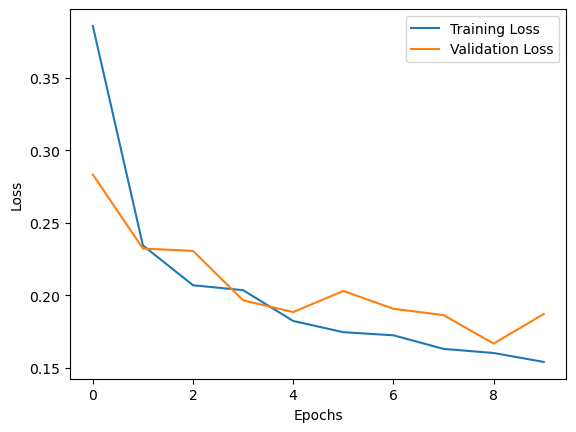

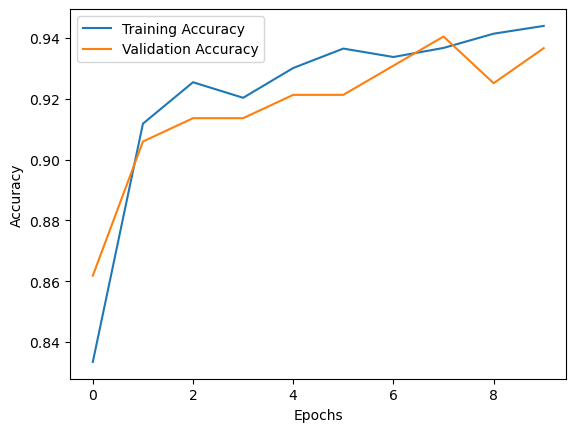

In [416]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
base_model.trainable = False

# Компилируем модель
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

# Обучаем модель с замороженными базовыми слоями
history = model.fit(train, epochs=1, validation_data=validation)

147/147 [==============================] - 2900s 20s/step - loss: 0.1773 - accuracy: 0.9397 - precision_3: 0.9321 - recall_3: 0.9327 - val_loss: 0.1644 - val_accuracy: 0.9367 - val_precision_3: 0.9393 - val_recall_3: 0.9213


(0.0, 1.0)

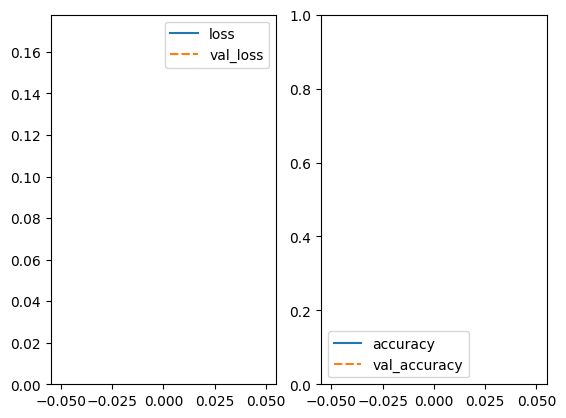

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
history = model.fit(datagen.flow(train, train_labels, batch_size=32), epochs=1, validation_data=(validation, validation_labels))
#callbacks=[esc])

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 88s 480ms/step - loss: 0.2031 - accuracy: 0.9258 - precision_1: 0.9206 - recall_1: 0.9199 - val_loss: 11.6298 - val_accuracy: 0.5000 - val_precision_1: 0.5000 - val_recall_1: 0.5000
Epoch 2/10
163/163 [==============================] - 73s 439ms/step - loss: 0.1700 - accuracy: 0.9314 - precision_1: 0.9288 - recall_1: 0.9306 - val_loss: 93332784.0000 - val_accuracy: 0.5625 - val_precision_1: 0.6000 - val_recall_1: 0.5625
Epoch 3/10
163/163 [==============================] - 69s 409ms/step - loss: 0.1533 - accuracy: 0.9398 - precision_1: 0.9387 - recall_1: 0.9394 - val_loss: 39852356.0000 - val_accuracy: 0.5000 - val_precision_1: 0.5000 - val_recall_1: 0.4375
Epoch 4/10
163/163 [==============================] - 69s 411ms/step - loss: 0.1563 - accuracy: 0.9425 - precision_1: 0.9413 - recall_1: 0.9413 - val_loss: 11.8961 - val_accuracy: 0.5000 - val_precision_1: 0.5263 - val_recall_1: 0.6250
Epoch 5/10
163/163 [========================

In [ ]:
import seaborn as sns

(0.0, 1.0)

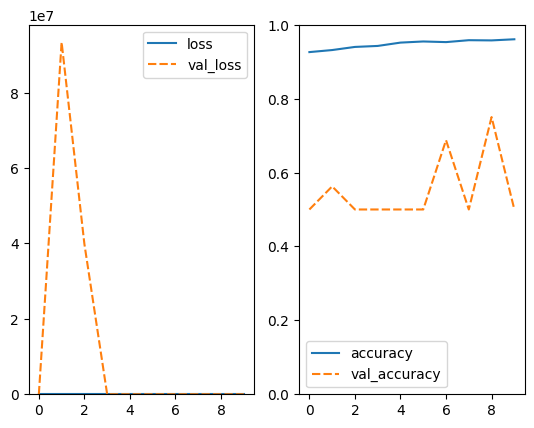

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

(0.0, 1.0)

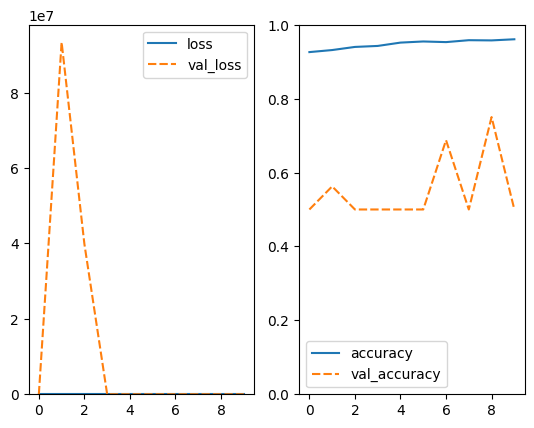

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

,loss,accuracy,precision_1,recall_1,val_loss,val_accuracy,val_precision_1,val_recall_1
0,0.203113,0.925805,0.920568,0.919862,1.162983e+01,0.5000,0.500000,0.5000
1,0.169969,0.931365,0.928817,0.930598,9.333278e+07,0.5625,0.600000,0.5625
2,0.153266,0.939801,0.938697,0.939417,3.985236e+07,0.5000,0.500000,0.4375
3,0.156268,0.942485,0.941334,0.941334,1.189609e+01,0.5000,0.526316,0.6250
4,0.130837,0.951495,0.952912,0.950537,1.200278e+00,0.5000,0.533333,0.5000
5,0.123436,0.954563,0.954519,0.953604,2.498685e+00,0.5000,0.500000,0.5000
6,0.123994,0.952837,0.952993,0.952262,9.284019e-01,0.6875,0.666667,0.7500
7,0.110249,0.958014,0.958557,0.957822,2.615576e+00,0.5000,0.500000,0.5000
8,0.107034,0.957439,0.957774,0.956672,7.069890e-01,0.7500,0.800000,0.7500
9,0.102417,0.960506,0.960506,0.960506,2.076975e+00,0.5000,0.500000,0.5000


In [365]:
model.metrics_names

['loss', 'accuracy', 'precision_8', 'recall_8']

In [417]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 174ms/step - loss: 0.3136 - accuracy: 0.8894 - precision_9: 0.8894 - recall_9: 0.8894
Потери модели на тестовом датасете: 0.3136012852191925
Точность модели на тестовом датасете: 88.942
Precision модели на тестовом датасете: 0.889
Recall модели на тестовом датасете: 0.889


In [418]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 177ms/step
              precision    recall  f1-score   support

           0       0.37      0.29      0.32       234
           1       0.62      0.70      0.66       390

    accuracy                           0.55       624
   macro avg       0.49      0.50      0.49       624
weighted avg       0.53      0.55      0.53       624



In [419]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.621867881548975


In [420]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.7


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

20/20 [==============================] - 6s 192ms/step


In [ ]:
# Predicting labels for the test set
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred, axis=1)

# Converting one-hot encoded test labels back to categorical labels
y_true = np.argmax(test_labels, axis=1)

In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.38      0.04      0.08       234
           1       0.63      0.96      0.76       390

    accuracy                           0.62       624
   macro avg       0.51      0.50      0.42       624
weighted avg       0.54      0.62      0.50       624



In [421]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 68 166]
 [117 273]]


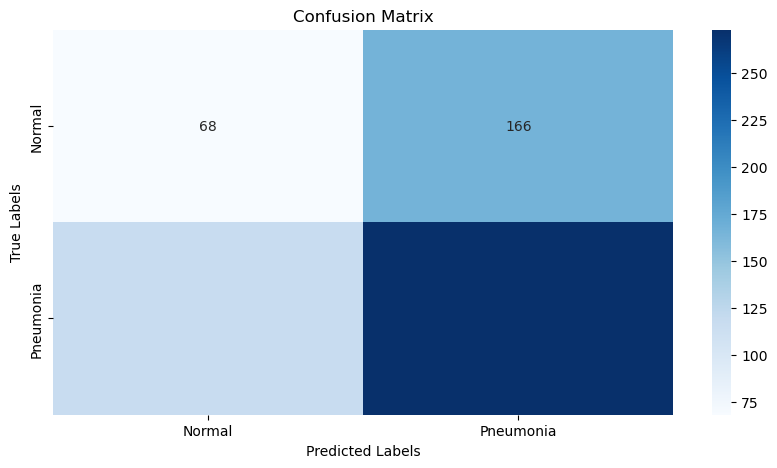

In [422]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [423]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:,1])
fpr, tpr, threshholds = roc_curve(y_true, y_pred_proba[:,1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:,1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5074116587638855


In [424]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5031832127985973


In [44]:
y_true

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [45]:
y_pred

array([1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,

In [50]:
fpr

array([0.        , 0.        , 0.00854701, 0.00854701, 0.01282051,
       0.01282051, 0.01709402, 0.01709402, 0.02136752, 0.02136752,
       0.02991453, 0.02991453, 0.03418803, 0.03418803, 0.04273504,
       0.04273504, 0.04700855, 0.04700855, 0.05555556, 0.05555556,
       0.05982906, 0.05982906, 0.06837607, 0.06837607, 0.07264957,
       0.07264957, 0.07264957, 0.07264957, 0.07692308, 0.07692308,
       0.08119658, 0.08119658, 0.08974359, 0.08974359, 0.09401709,
       0.09401709, 0.1025641 , 0.1025641 , 0.10683761, 0.10683761,
       0.11111111, 0.11111111, 0.11965812, 0.11965812, 0.12820513,
       0.12820513, 0.13247863, 0.13247863, 0.14102564, 0.14102564,
       0.14957265, 0.14957265, 0.15384615, 0.15384615, 0.15811966,
       0.15811966, 0.16239316, 0.16239316, 0.16666667, 0.16666667,
       0.17521368, 0.17521368, 0.18803419, 0.18803419, 0.1965812 ,
       0.1965812 , 0.2008547 , 0.2008547 , 0.20512821, 0.20512821,
       0.20940171, 0.20940171, 0.21367521, 0.21367521, 0.21794

In [51]:
tpr

array([0.        , 0.0025641 , 0.0025641 , 0.00512821, 0.00512821,
       0.01282051, 0.01282051, 0.01794872, 0.01794872, 0.02564103,
       0.02564103, 0.03846154, 0.03846154, 0.04102564, 0.04102564,
       0.04615385, 0.04615385, 0.05128205, 0.05128205, 0.05384615,
       0.05384615, 0.05897436, 0.05897436, 0.06666667, 0.06666667,
       0.06923077, 0.07435897, 0.08974359, 0.08974359, 0.09230769,
       0.09230769, 0.09487179, 0.09487179, 0.10512821, 0.10512821,
       0.11282051, 0.11282051, 0.11538462, 0.11538462, 0.12051282,
       0.12051282, 0.12820513, 0.12820513, 0.13846154, 0.13846154,
       0.15641026, 0.15641026, 0.16410256, 0.16410256, 0.16923077,
       0.16923077, 0.17948718, 0.17948718, 0.19230769, 0.19230769,
       0.19487179, 0.19487179, 0.21025641, 0.21025641, 0.22307692,
       0.22307692, 0.22564103, 0.22564103, 0.23589744, 0.23589744,
       0.24358974, 0.24358974, 0.25384615, 0.25641026, 0.26410256,
       0.26410256, 0.26666667, 0.26666667, 0.27435897, 0.27435

Text(0.5, 1.0, 'ROC Curve')

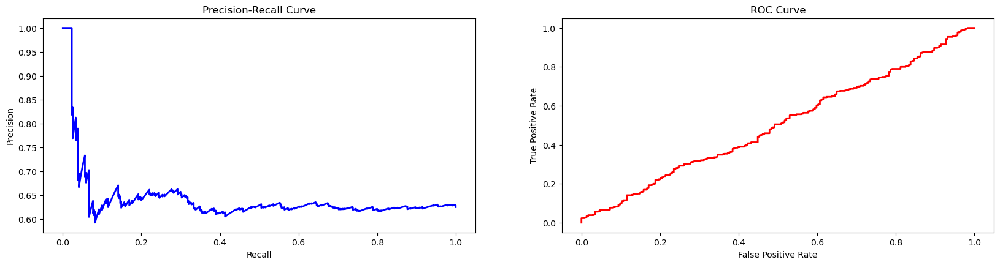

In [425]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#VGG19

In [427]:
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3), pooling="max", classifier_activation="softmax")

In [428]:
for layer in base_model.layers:
    layer.trainable=False

In [429]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [430]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
#model.add(Dense(4096, activation='relu'))
#model.add(BatchNormalization())
#model.add(Dense(4096, activation='relu'))
#model.add(Dropout(0.1))
#model.add(BatchNormalization())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [431]:
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

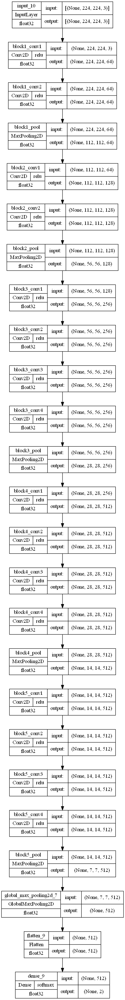

In [432]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [433]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [434]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [435]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 62s 422ms/sample - loss: 0.3460 - accuracy: 0.8501 - precision_10: 0.8501 - recall_10: 0.8501 - val_loss: 0.2935 - val_accuracy: 0.8829 - val_precision_10: 0.8829 - val_recall_10: 0.8829
Epoch 2/10
147/147 [==============================] - 59s 404ms/sample - loss: 0.2615 - accuracy: 0.8888 - precision_10: 0.8888 - recall_10: 0.8888 - val_loss: 0.2617 - val_accuracy: 0.8906 - val_precision_10: 0.8906 - val_recall_10: 0.8906
Epoch 3/10
147/147 [==============================] - 60s 407ms/sample - loss: 0.2276 - accuracy: 0.9052 - precision_10: 0.9052 - recall_10: 0.9052 - val_loss: 0.2511 - val_accuracy: 0.9021 - val_precision_10: 0.9021 - val_recall_10: 0.9021
Epoch 4/10
147/147 [==============================] - 60s 406ms/sample - loss: 0.2159 - accuracy: 0.9116 - precision_10: 0.9116 - recall_10: 0.9116 - val_loss: 0.2151 - val_accuracy: 0.9002 - val_precision_10: 0.9002 - val_recall_10: 0.9002
Epoch 5/10
147/147 [================

In [436]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

In [ ]:
# Размораживаем веса и обучаем модель дальше
base_model.trainable=True


# Задаем learning rate
learning_rate = 0.00001

# Создаем оптимизатор с нужным learning rate
optimizer = Adam(learning_rate=learning_rate)

model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

In [ ]:
fine_tuning_history = model.fit(train, epochs=5, validation_data=validation)

In [ ]:
for key in total_history.keys():
    total_history[key].extend(fine_tuning_history.history[key])

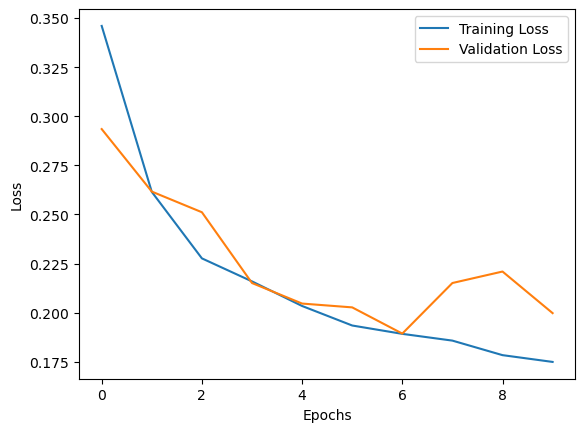

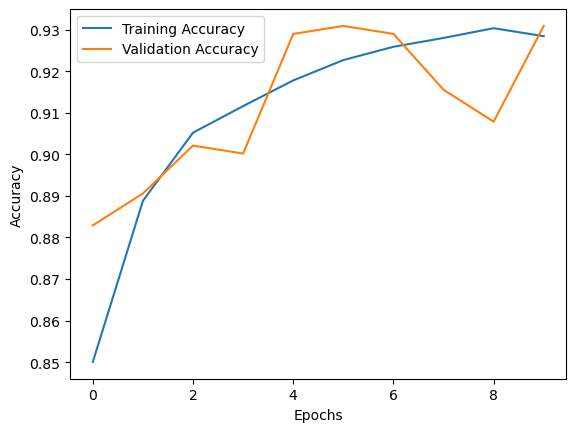

In [437]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 89s 492ms/step - loss: 0.3293 - accuracy: 0.8602 - precision_2: 0.8443 - recall_2: 0.8533 - val_loss: 3.6745 - val_accuracy: 0.5000 - val_precision_2: 0.5000 - val_recall_2: 0.5000
Epoch 2/10
163/163 [==============================] - 83s 499ms/step - loss: 0.1851 - accuracy: 0.9335 - precision_2: 0.9320 - recall_2: 0.9302 - val_loss: 6.1067 - val_accuracy: 0.5000 - val_precision_2: 0.5000 - val_recall_2: 0.5000
Epoch 3/10
163/163 [==============================] - 82s 484ms/step - loss: 0.1627 - accuracy: 0.9369 - precision_2: 0.9352 - recall_2: 0.9360 - val_loss: 0.6219 - val_accuracy: 0.6875 - val_precision_2: 0.7333 - val_recall_2: 0.6875
Epoch 4/10
163/163 [==============================] - 81s 483ms/step - loss: 0.1469 - accuracy: 0.9410 - precision_2: 0.9417 - recall_2: 0.9417 - val_loss: 1.9570 - val_accuracy: 0.5000 - val_precision_2: 0.5000 - val_recall_2: 0.5000
Epoch 5/10
163/163 [==============================] - 81s 48

In [ ]:
import seaborn as sns

(0.0, 1.0)

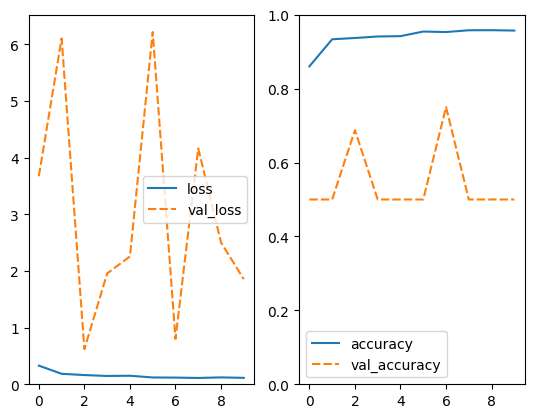

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [438]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 178ms/step - loss: 0.3996 - accuracy: 0.8429 - precision_10: 0.8429 - recall_10: 0.8429
Потери модели на тестовом датасете: 0.39955785870552063
Точность модели на тестовом датасете: 84.295
Precision модели на тестовом датасете: 0.843
Recall модели на тестовом датасете: 0.843


In [439]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 180ms/step
              precision    recall  f1-score   support

           0       0.41      0.28      0.34       234
           1       0.64      0.76      0.69       390

    accuracy                           0.58       624
   macro avg       0.53      0.52      0.51       624
weighted avg       0.55      0.58      0.56       624



In [440]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.6379310344827587


In [441]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.7589743589743589


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

20/20 [==============================] - 7s 190ms/step


In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.39      0.03      0.06       234
           1       0.63      0.97      0.76       390

    accuracy                           0.62       624
   macro avg       0.51      0.50      0.41       624
weighted avg       0.54      0.62      0.50       624



In [442]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 66 168]
 [ 94 296]]


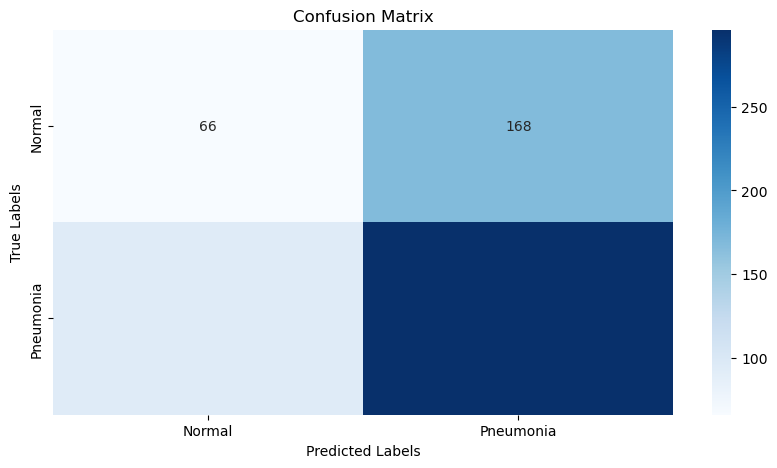

In [443]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [444]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5474468551391629


In [445]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5474468551391629


Text(0.5, 1.0, 'ROC Curve')

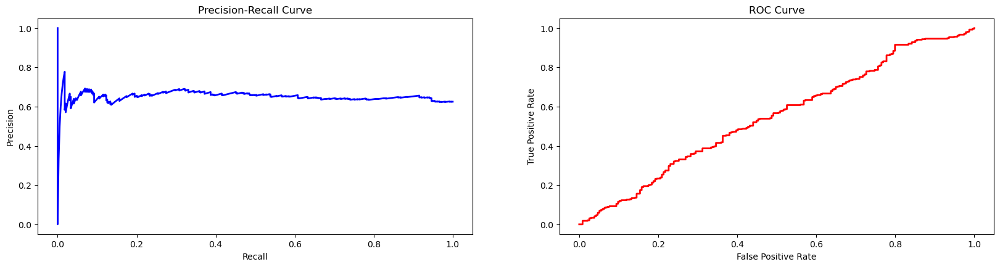

In [446]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#Resnet50

In [682]:
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224,224,3), pooling="max", classifier_activation="softmax")

In [684]:
for layer in base_model.layers:
    layer.trainable=False

In [686]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [688]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [690]:
model.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_16 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_16[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

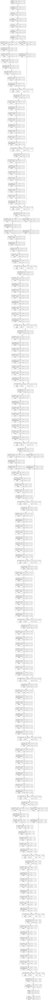

In [692]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [694]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [696]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [698]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
# Создание коллбэка для отображения progress bar
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 64s 432ms/sample - loss: 0.4765 - accuracy: 0.7691 - precision_16: 0.7691 - recall_16: 0.7691 - val_loss: 0.4019 - val_accuracy: 0.8061 - val_precision_16: 0.8061 - val_recall_16: 0.8061
Epoch 2/10
147/147 [==============================] - 59s 400ms/sample - loss: 0.3733 - accuracy: 0.8290 - precision_16: 0.8290 - recall_16: 0.8290 - val_loss: 0.3722 - val_accuracy: 0.8676 - val_precision_16: 0.8676 - val_recall_16: 0.8676
Epoch 3/10
147/147 [==============================] - 59s 403ms/sample - loss: 0.3463 - accuracy: 0.8430 - precision_16: 0.8430 - recall_16: 0.8430 - val_loss: 0.3331 - val_accuracy: 0.8503 - val_precision_16: 0.8503 - val_recall_16: 0.8503
Epoch 4/10
147/147 [==============================] - 59s 403ms/sample - loss: 0.3214 - accuracy: 0.8581 - precision_16: 0.8581 - recall_16: 0.8581 - val_loss: 0.3255 - val_accuracy: 0.8733 - val_precision_16: 0.8733 - val_recall_16: 0.8733
Epoch 5/10
147/147 [================

In [699]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

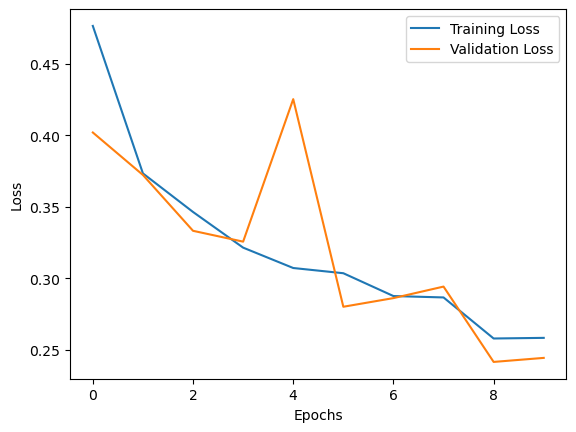

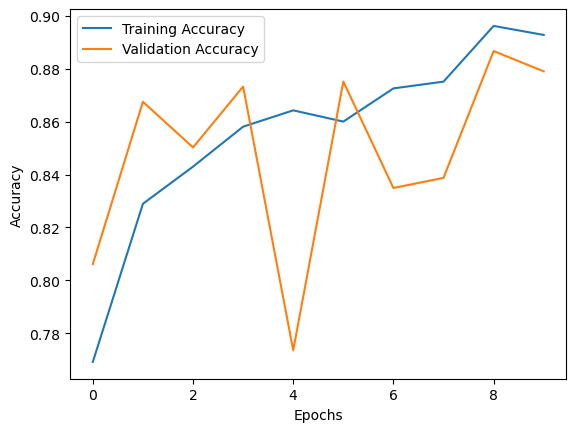

In [700]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 164s 374ms/step - loss: 0.1758 - accuracy: 0.9423 - precision_3: 0.9426 - recall_3: 0.9436 - val_loss: 7.5542 - val_accuracy: 0.5625 - val_precision_3: 0.5625 - val_recall_3: 0.5625
Epoch 2/10
163/163 [==============================] - 57s 336ms/step - loss: 0.0993 - accuracy: 0.9647 - precision_3: 0.9637 - recall_3: 0.9628 - val_loss: 0.2661 - val_accuracy: 0.8750 - val_precision_3: 0.8333 - val_recall_3: 0.9375
Epoch 3/10
163/163 [==============================] - 57s 341ms/step - loss: 0.0731 - accuracy: 0.9745 - precision_3: 0.9731 - recall_3: 0.9728 - val_loss: 1.1615 - val_accuracy: 0.5000 - val_precision_3: 0.5000 - val_recall_3: 0.5000
Epoch 4/10
163/163 [==============================] - 58s 344ms/step - loss: 0.0557 - accuracy: 0.9810 - precision_3: 0.9810 - recall_3: 0.9799 - val_loss: 3.3281 - val_accuracy: 0.5000 - val_precision_3: 0.5000 - val_recall_3: 0.5000
Epoch 5/10
163/163 [==============================] - 58s 3

In [ ]:
import seaborn as sns

(0.0, 1.0)

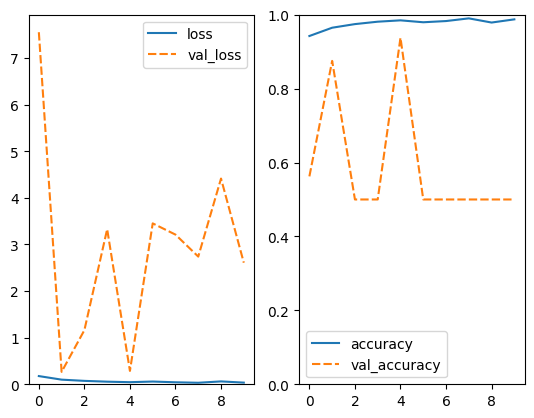

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

,loss,accuracy,precision_3,recall_3,val_loss,val_accuracy,val_precision_3,val_recall_3
0,0.175819,0.942293,0.942551,0.943635,7.554212,0.5625,0.562500,0.5625
1,0.099345,0.964724,0.963731,0.962807,0.266090,0.8750,0.833333,0.9375
2,0.073094,0.974502,0.973149,0.972776,1.161507,0.5000,0.500000,0.5000
3,0.055742,0.981020,0.980998,0.979870,3.328144,0.5000,0.500000,0.5000
4,0.044835,0.984663,0.985226,0.984471,0.287297,0.9375,0.937500,0.9375
5,0.058628,0.979486,0.979470,0.978719,3.452147,0.5000,0.500000,0.5000
6,0.042625,0.982745,0.983317,0.983129,3.211239,0.5000,0.500000,0.5000
7,0.032493,0.990031,0.990407,0.989647,2.739418,0.5000,0.500000,0.5000
8,0.061573,0.978719,0.978340,0.978528,4.413943,0.5000,0.500000,0.5000
9,0.035394,0.987347,0.987157,0.987347,2.608489,0.5000,0.500000,0.5000


In [701]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 174ms/step - loss: 0.4909 - accuracy: 0.7708 - precision_16: 0.7708 - recall_16: 0.7708
Потери модели на тестовом датасете: 0.4909110963344574
Точность модели на тестовом датасете: 77.083
Precision модели на тестовом датасете: 0.771
Recall модели на тестовом датасете: 0.771


In [702]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 172ms/step
              precision    recall  f1-score   support

           0       0.36      0.16      0.22       234
           1       0.62      0.83      0.71       390

    accuracy                           0.58       624
   macro avg       0.49      0.50      0.47       624
weighted avg       0.52      0.58      0.53       624



In [703]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.6223506743737958


In [704]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.8282051282051283


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

20/20 [==============================] - 6s 162ms/step


In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.62      1.00      0.77       390

    accuracy                           0.62       624
   macro avg       0.31      0.50      0.38       624
weighted avg       0.39      0.62      0.48       624



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [705]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 38 196]
 [ 67 323]]


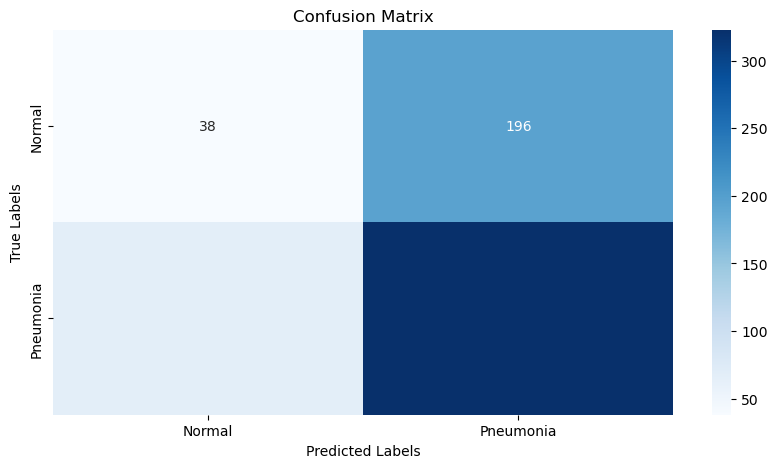

In [706]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [707]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.7368783354759216


In [708]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.48902038132807363


Text(0.5, 1.0, 'ROC Curve')

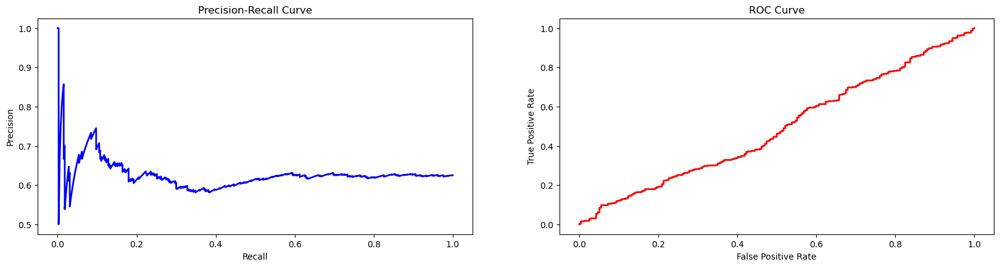

In [709]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#ConvNeXtTiny

In [468]:
base_model = ConvNeXtTiny(weights='imagenet', include_top=False, input_shape=(224,224,3), pooling="max", classifier_activation="softmax")

In [469]:
for layer in base_model.layers:
    layer.trainable=False

In [470]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [471]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [472]:
model.summary()

Model: "model_11"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 convnext_tiny_prestem_normaliz  (None, 224, 224, 3)  0          ['input_12[0][0]']               
 ation (Normalization)                                                                            
                                                                                                  
 convnext_tiny_stem (Sequential  (None, 56, 56, 96)  4896        ['convnext_tiny_prestem_normaliza
 )                                                               tion[0][0]']              

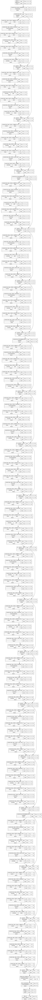

In [473]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [474]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [475]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [476]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
# Создание коллбэка для отображения progress bar
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 79s 538ms/sample - loss: 0.5006 - accuracy: 0.7642 - precision_12: 0.7642 - recall_12: 0.7642 - val_loss: 0.4677 - val_accuracy: 0.7812 - val_precision_12: 0.7812 - val_recall_12: 0.7812
Epoch 2/10
147/147 [==============================] - 63s 426ms/sample - loss: 0.4557 - accuracy: 0.7868 - precision_12: 0.7868 - recall_12: 0.7868 - val_loss: 0.4515 - val_accuracy: 0.7831 - val_precision_12: 0.7831 - val_recall_12: 0.7831
Epoch 3/10
147/147 [==============================] - 59s 404ms/sample - loss: 0.4332 - accuracy: 0.7970 - precision_12: 0.7970 - recall_12: 0.7970 - val_loss: 0.4432 - val_accuracy: 0.7869 - val_precision_12: 0.7869 - val_recall_12: 0.7869
Epoch 4/10
147/147 [==============================] - 59s 402ms/sample - loss: 0.4190 - accuracy: 0.8085 - precision_12: 0.8085 - recall_12: 0.8085 - val_loss: 0.4136 - val_accuracy: 0.8081 - val_precision_12: 0.8081 - val_recall_12: 0.8081
Epoch 5/10
147/147 [================

In [477]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

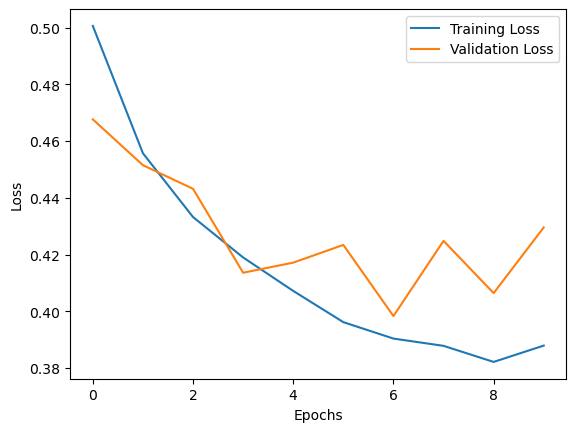

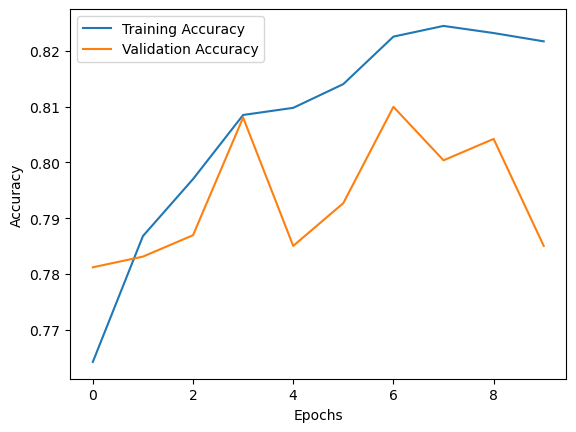

In [478]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 165s 706ms/step - loss: 0.1749 - accuracy: 0.9390 - precision_4: 0.9342 - recall_4: 0.9337 - val_loss: 0.9015 - val_accuracy: 0.5625 - val_precision_4: 0.6000 - val_recall_4: 0.5625
Epoch 2/10
163/163 [==============================] - 112s 673ms/step - loss: 0.0650 - accuracy: 0.9770 - precision_4: 0.9772 - recall_4: 0.9774 - val_loss: 5.0619 - val_accuracy: 0.5000 - val_precision_4: 0.5000 - val_recall_4: 0.5000
Epoch 3/10
163/163 [==============================] - 112s 675ms/step - loss: 0.0491 - accuracy: 0.9826 - precision_4: 0.9827 - recall_4: 0.9818 - val_loss: 2.5930 - val_accuracy: 0.5000 - val_precision_4: 0.5000 - val_recall_4: 0.5000
Epoch 4/10
163/163 [==============================] - 113s 675ms/step - loss: 0.0403 - accuracy: 0.9860 - precision_4: 0.9851 - recall_4: 0.9854 - val_loss: 0.1537 - val_accuracy: 0.9375 - val_precision_4: 1.0000 - val_recall_4: 0.9375
Epoch 5/10
163/163 [==============================] - 11

In [ ]:
import seaborn as sns

(0.0, 1.0)

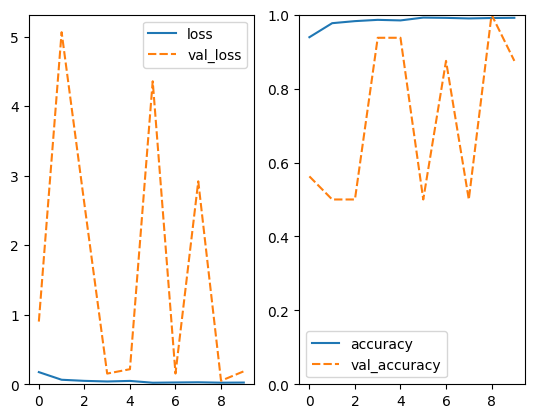

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

,loss,accuracy,precision_4,recall_4,val_loss,val_accuracy,val_precision_4,val_recall_4
0,0.174889,0.939034,0.934203,0.933666,0.901490,0.5625,0.600000,0.5625
1,0.065003,0.976994,0.977190,0.977377,5.061944,0.5000,0.500000,0.5000
2,0.049116,0.982554,0.982729,0.981787,2.592950,0.5000,0.500000,0.5000
3,0.040285,0.986005,0.985052,0.985429,0.153726,0.9375,1.000000,0.9375
4,0.048363,0.984471,0.984075,0.983321,0.216593,0.9375,0.933333,0.8750
5,0.022248,0.992140,0.992141,0.992331,4.356505,0.5000,0.500000,0.5000
6,0.025804,0.991373,0.990232,0.991181,0.154500,0.8750,0.933333,0.8750
7,0.028617,0.989839,0.988885,0.989264,2.917902,0.5000,0.500000,0.5000
8,0.022980,0.990989,0.991176,0.990606,0.050793,1.0000,1.000000,0.9375
9,0.024736,0.991564,0.991568,0.991948,0.186686,0.8750,0.866667,0.8125


In [479]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 206ms/step - loss: 0.5474 - accuracy: 0.7196 - precision_12: 0.7196 - recall_12: 0.7196
Потери модели на тестовом датасете: 0.5473600625991821
Точность модели на тестовом датасете: 71.955
Precision модели на тестовом датасете: 0.72
Recall модели на тестовом датасете: 0.72


In [480]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 5s 186ms/step
              precision    recall  f1-score   support

           0       0.42      0.22      0.29       234
           1       0.64      0.82      0.72       390

    accuracy                           0.59       624
   macro avg       0.53      0.52      0.50       624
weighted avg       0.56      0.59      0.56       624



In [481]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.6367265469061876


In [482]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.8179487179487179


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

20/20 [==============================] - 10s 235ms/step


In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.39      0.18      0.24       234
           1       0.63      0.84      0.72       390

    accuracy                           0.59       624
   macro avg       0.51      0.51      0.48       624
weighted avg       0.54      0.59      0.54       624



In [483]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 52 182]
 [ 71 319]]


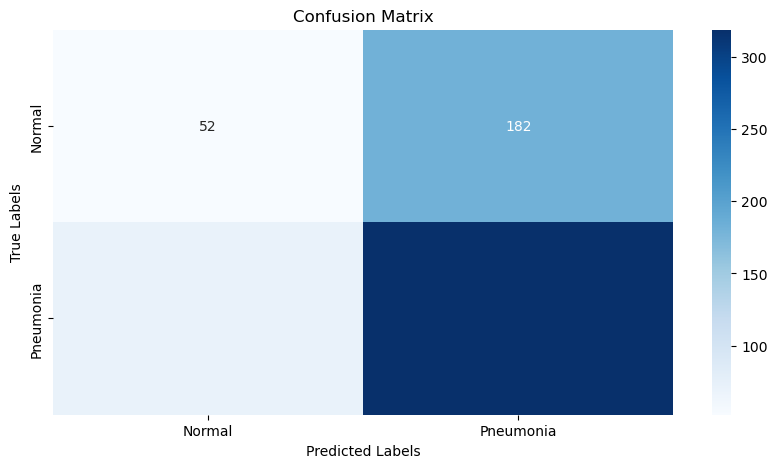

In [484]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [485]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5188223123550415


In [486]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.5405106289721674


Text(0.5, 1.0, 'ROC Curve')

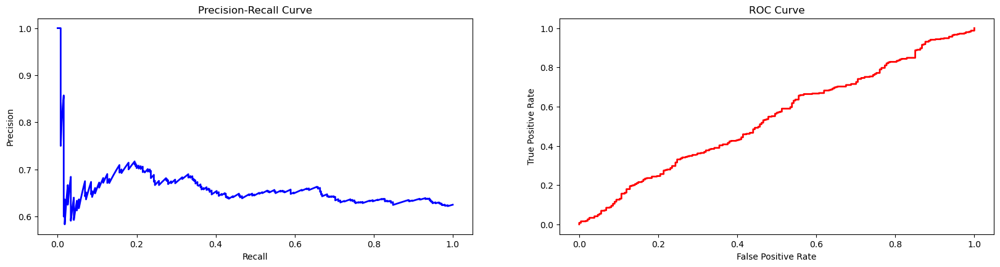

In [487]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#EfficientNetB0

In [489]:
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224,224,3), pooling="max", classifier_activation="softmax")

In [490]:
for layer in base_model.layers:
    layer.trainable=False

In [491]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [492]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [493]:
model.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_13 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_2 (Rescaling)        (None, 224, 224, 3)  0           ['input_13[0][0]']               
                                                                                                  
 normalization_1 (Normalization  (None, 224, 224, 3)  7          ['rescaling_2[0][0]']            
 )                                                                                                
                                                                                           

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.963055 to fit



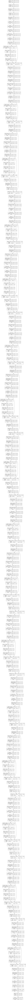

In [494]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [495]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [496]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [497]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
# Создание коллбэка для отображения progress bar
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 63s 431ms/sample - loss: 0.6784 - accuracy: 0.6982 - precision_13: 0.6982 - recall_13: 0.6982 - val_loss: 0.6649 - val_accuracy: 0.7428 - val_precision_13: 0.7428 - val_recall_13: 0.7428
Epoch 2/10
147/147 [==============================] - 60s 411ms/sample - loss: 0.6093 - accuracy: 0.7321 - precision_13: 0.7321 - recall_13: 0.7321 - val_loss: 0.6253 - val_accuracy: 0.7428 - val_precision_13: 0.7428 - val_recall_13: 0.7428
Epoch 3/10
147/147 [==============================] - 61s 416ms/sample - loss: 0.6775 - accuracy: 0.6914 - precision_13: 0.6914 - recall_13: 0.6914 - val_loss: 0.5733 - val_accuracy: 0.7428 - val_precision_13: 0.7428 - val_recall_13: 0.7428
Epoch 4/10
147/147 [==============================] - 60s 409ms/sample - loss: 0.6120 - accuracy: 0.7195 - precision_13: 0.7195 - recall_13: 0.7195 - val_loss: 0.6706 - val_accuracy: 0.7428 - val_precision_13: 0.7428 - val_recall_13: 0.7428
Epoch 5/10
147/147 [================

In [498]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

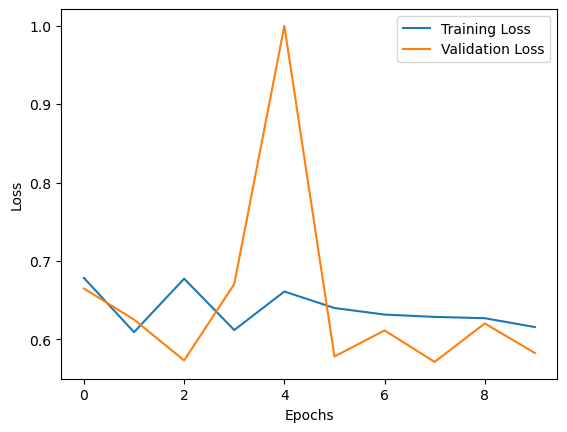

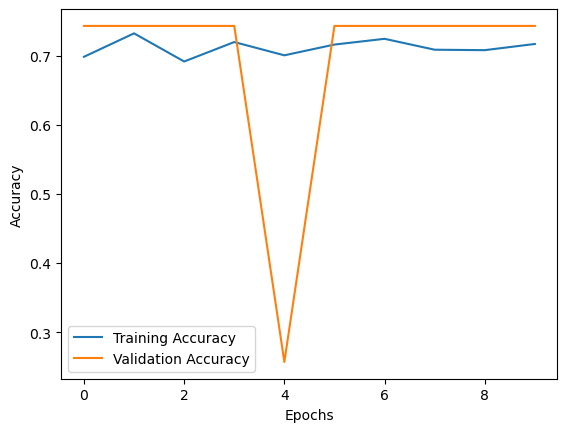

In [499]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 104s 345ms/step - loss: 0.1491 - accuracy: 0.9505 - precision_5: 0.9474 - recall_5: 0.9457 - val_loss: 1.5665 - val_accuracy: 0.5000 - val_precision_5: 0.5000 - val_recall_5: 0.5000
Epoch 2/10
163/163 [==============================] - 55s 323ms/step - loss: 0.0521 - accuracy: 0.9826 - precision_5: 0.9820 - recall_5: 0.9810 - val_loss: 1.5646 - val_accuracy: 0.5625 - val_precision_5: 0.5625 - val_recall_5: 0.5625
Epoch 3/10
163/163 [==============================] - 54s 317ms/step - loss: 0.0285 - accuracy: 0.9921 - precision_5: 0.9910 - recall_5: 0.9916 - val_loss: 0.1733 - val_accuracy: 0.8750 - val_precision_5: 0.8750 - val_recall_5: 0.8750
Epoch 4/10
163/163 [==============================] - 56s 323ms/step - loss: 0.0319 - accuracy: 0.9883 - precision_5: 0.9877 - recall_5: 0.9879 - val_loss: 0.0040 - val_accuracy: 1.0000 - val_precision_5: 1.0000 - val_recall_5: 1.0000
Epoch 5/10
163/163 [==============================] - 54s 3

In [ ]:
import seaborn as sns

(0.0, 1.0)

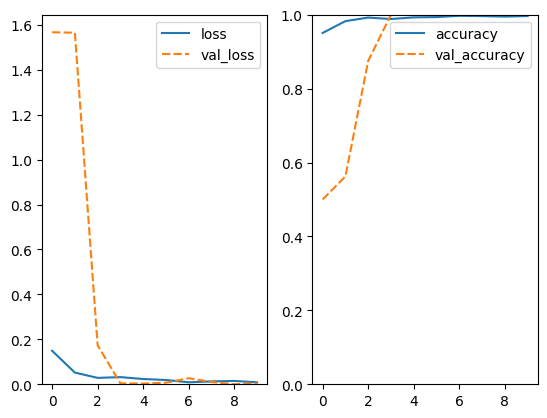

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

,loss,accuracy,precision_5,recall_5,val_loss,val_accuracy,val_precision_5,val_recall_5
0,0.149060,0.950537,0.947379,0.945744,1.566477,0.5000,0.5000,0.5000
1,0.052057,0.982554,0.981961,0.981020,1.564573,0.5625,0.5625,0.5625
2,0.028493,0.992140,0.990994,0.991564,0.173344,0.8750,0.8750,0.8750
3,0.031880,0.988305,0.987732,0.987922,0.003964,1.0000,1.0000,1.0000
4,0.023454,0.992715,0.991952,0.992523,0.003258,1.0000,1.0000,1.0000
5,0.019038,0.993482,0.993292,0.993673,0.007020,1.0000,1.0000,1.0000
6,0.008821,0.996933,0.997124,0.996933,0.026900,1.0000,1.0000,1.0000
7,0.012707,0.996166,0.996356,0.995974,0.010069,1.0000,1.0000,1.0000
8,0.014899,0.994824,0.994253,0.995015,0.000348,1.0000,1.0000,1.0000
9,0.008645,0.996357,0.996166,0.996357,0.004115,1.0000,1.0000,1.0000


In [500]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 180ms/step - loss: 0.7551 - accuracy: 0.6250 - precision_13: 0.6250 - recall_13: 0.6250
Потери модели на тестовом датасете: 0.7551488876342773
Точность модели на тестовом датасете: 62.5
Precision модели на тестовом датасете: 0.625
Recall модели на тестовом датасете: 0.625


In [501]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 174ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.62      1.00      0.77       390

    accuracy                           0.62       624
   macro avg       0.31      0.50      0.38       624
weighted avg       0.39      0.62      0.48       624



D:\anaconda3\envs\gpu_env\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\gpu_env\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
D:\anaconda3\envs\gpu_env\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [502]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.625


In [503]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 1.0


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

20/20 [==============================] - 6s 141ms/step


In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.36      0.21      0.27       234
           1       0.62      0.78      0.69       390

    accuracy                           0.57       624
   macro avg       0.49      0.49      0.48       624
weighted avg       0.52      0.57      0.53       624



In [504]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[  0 234]
 [  0 390]]


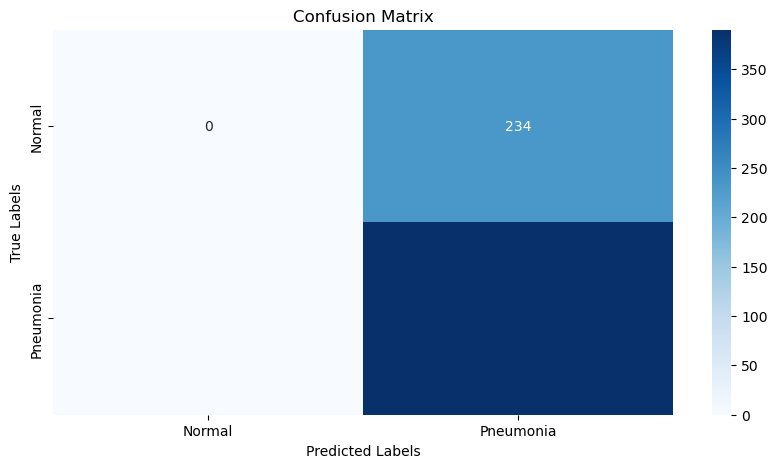

In [505]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [506]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.8112035989761353


In [507]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.529278983125137


Text(0.5, 1.0, 'ROC Curve')

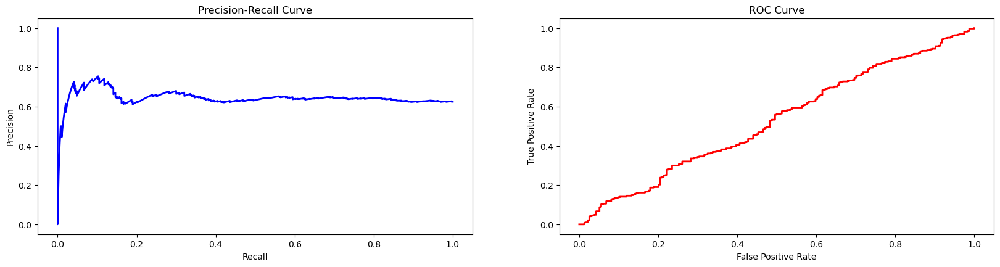

In [508]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#InceptionV3

In [510]:
base_model = InceptionV3(include_top=False,weights="imagenet",input_shape=(224,224,3),pooling="max", classifier_activation="softmax",)

In [511]:
for layer in base_model.layers:
    layer.trainable=False

In [512]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [513]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [514]:
model.summary()

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_14 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_94 (Conv2D)             (None, 111, 111, 32  864         ['input_14[0][0]']               
                                )                                                                 
                                                                                                  
 batch_normalization_94 (BatchN  (None, 111, 111, 32  96         ['conv2d_94[0][0]']              
 ormalization)                  )                                                          

In [515]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [516]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [517]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [518]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 62s 424ms/sample - loss: 0.3783 - accuracy: 0.8567 - precision_14: 0.8567 - recall_14: 0.8567 - val_loss: 0.4493 - val_accuracy: 0.8273 - val_precision_14: 0.8273 - val_recall_14: 0.8273
Epoch 2/10
147/147 [==============================] - 59s 403ms/sample - loss: 0.2210 - accuracy: 0.9105 - precision_14: 0.9105 - recall_14: 0.9105 - val_loss: 0.3541 - val_accuracy: 0.8464 - val_precision_14: 0.8464 - val_recall_14: 0.8464
Epoch 3/10
147/147 [==============================] - 59s 403ms/sample - loss: 0.1895 - accuracy: 0.9278 - precision_14: 0.9278 - recall_14: 0.9278 - val_loss: 0.2100 - val_accuracy: 0.9155 - val_precision_14: 0.9155 - val_recall_14: 0.9155
Epoch 4/10
147/147 [==============================] - 59s 399ms/sample - loss: 0.2045 - accuracy: 0.9212 - precision_14: 0.9212 - recall_14: 0.9212 - val_loss: 0.3496 - val_accuracy: 0.8695 - val_precision_14: 0.8695 - val_recall_14: 0.8695
Epoch 5/10
147/147 [================

In [519]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

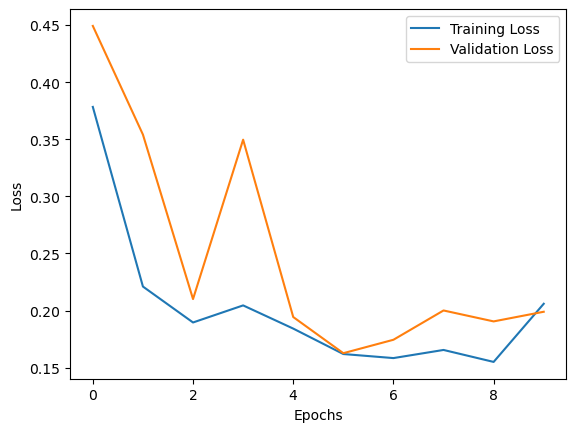

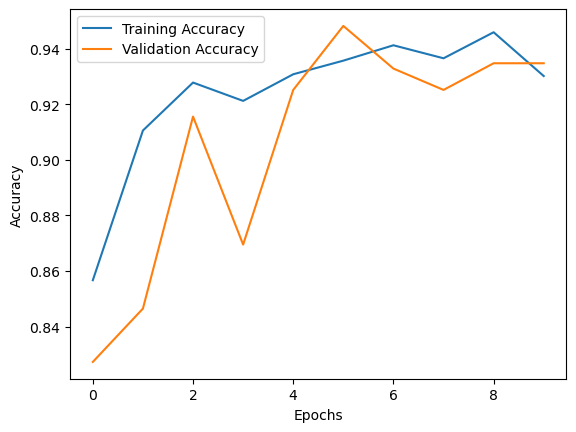

In [520]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

Epoch 1/10
163/163 [==============================] - 97s 336ms/step - loss: 0.0331 - accuracy: 0.9872 - precision_6: 0.9868 - recall_6: 0.9873 - val_loss: 4.2837e-04 - val_accuracy: 1.0000 - val_precision_6: 1.0000 - val_recall_6: 1.0000
Epoch 2/10
163/163 [==============================] - 55s 320ms/step - loss: 0.0133 - accuracy: 0.9964 - precision_6: 0.9964 - recall_6: 0.9964 - val_loss: 5.7758 - val_accuracy: 0.5000 - val_precision_6: 0.5000 - val_recall_6: 0.5000
Epoch 3/10
 40/163 [======>.......................] - ETA: 43s - loss: 0.0263 - accuracy: 0.9891 - precision_6: 0.9891 - recall_6: 0.9898

In [ ]:
import seaborn as sns

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

In [521]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 175ms/step - loss: 0.8381 - accuracy: 0.8093 - precision_14: 0.8093 - recall_14: 0.8093
Потери модели на тестовом датасете: 0.8381471037864685
Точность модели на тестовом датасете: 80.929
Precision модели на тестовом датасете: 0.809
Recall модели на тестовом датасете: 0.809


In [522]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 175ms/step
              precision    recall  f1-score   support

           0       0.42      0.24      0.30       234
           1       0.64      0.81      0.71       390

    accuracy                           0.59       624
   macro avg       0.53      0.52      0.51       624
weighted avg       0.56      0.59      0.56       624



In [523]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.6369168356997972


In [524]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.8051282051282052


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

In [525]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 55 179]
 [ 76 314]]


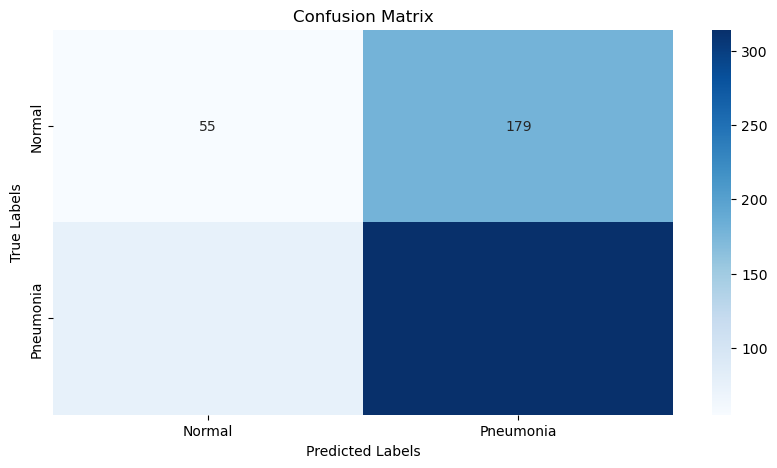

In [526]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [527]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.46171486377716064


In [528]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.500180802103879


Text(0.5, 1.0, 'ROC Curve')

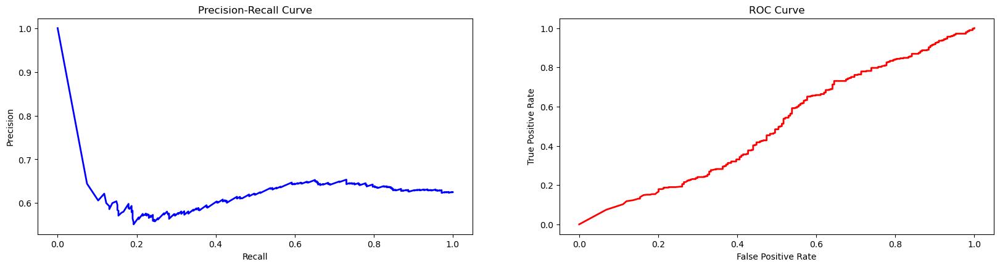

In [529]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')

#MobileNet

In [531]:
base_model = MobileNet(
    input_shape=(224,224,3),
    alpha=1.0,
    depth_multiplier=1,
    dropout=0.001,
    include_top=False,
    weights="imagenet",
    pooling="max",
    classifier_activation="softmax",
)

In [532]:
for layer in base_model.layers:
    layer.trainable=False

In [533]:
x = Flatten()(base_model.output)
result = Dense(2, activation='softmax')(x)

In [534]:
model = Model(inputs=base_model.input, outputs=result)

In [ ]:
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(1000, activation='relu'))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(Dense(2, activation='sigmoid'))

In [535]:
model.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                                   

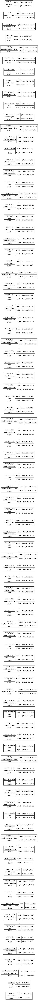

In [536]:
keras.utils.plot_model(
    model,
    show_shapes=True,
    show_dtype=True,
    show_layer_activations=True
)

In [537]:
model.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy", tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

In [ ]:
#esc = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)

In [538]:
total_history = {'loss': [], 'accuracy': [], 'val_loss': [], 'val_accuracy': []}

In [539]:
# Замораживаем все слои base_model, чтобы предотвратить их обучение
#base_model.trainable = False
# Создание коллбэка для отображения progress bar
progbar_logger = tf.keras.callbacks.ProgbarLogger()
frozen_history = model.fit(train, epochs=10, validation_data=validation, callbacks=[progbar_logger])

Epoch 1/10
147/147 [==============================] - 62s 420ms/sample - loss: 0.4142 - accuracy: 0.8650 - precision_15: 0.8650 - recall_15: 0.8650 - val_loss: 0.3805 - val_accuracy: 0.8983 - val_precision_15: 0.8983 - val_recall_15: 0.8983
Epoch 2/10
147/147 [==============================] - 60s 407ms/sample - loss: 0.2131 - accuracy: 0.9284 - precision_15: 0.9284 - recall_15: 0.9284 - val_loss: 0.2249 - val_accuracy: 0.9194 - val_precision_15: 0.9194 - val_recall_15: 0.9194
Epoch 3/10
147/147 [==============================] - 60s 411ms/sample - loss: 0.1838 - accuracy: 0.9382 - precision_15: 0.9382 - recall_15: 0.9382 - val_loss: 0.3170 - val_accuracy: 0.9251 - val_precision_15: 0.9251 - val_recall_15: 0.9251
Epoch 4/10
147/147 [==============================] - 60s 409ms/sample - loss: 0.1671 - accuracy: 0.9433 - precision_15: 0.9433 - recall_15: 0.9433 - val_loss: 0.2360 - val_accuracy: 0.9271 - val_precision_15: 0.9271 - val_recall_15: 0.9271
Epoch 5/10
147/147 [================

In [540]:
for key in total_history.keys():
    total_history[key].extend(frozen_history.history[key])

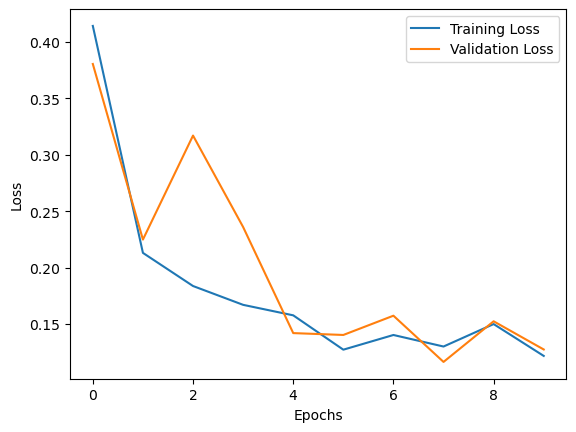

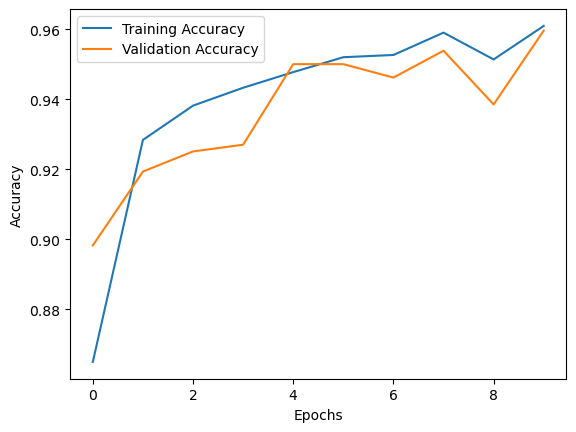

In [541]:
plt.plot(total_history['loss'], label='Training Loss')
plt.plot(total_history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.plot(total_history['accuracy'], label='Training Accuracy')
plt.plot(total_history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
history = model.fit(train, epochs=10, validation_data=validation)
#callbacks=[esc])

In [ ]:
import seaborn as sns

In [ ]:
df = pd.DataFrame(history.history)

f, axes = plt.subplots(1, 2)

ax = sns.lineplot(data=df[['loss', 'val_loss']], ax=axes[0])
ax.set_ylim(0)

ax = sns.lineplot(data=df[['accuracy', 'val_accuracy']], ax=axes[1])
ax.set_ylim(0, 1)

In [ ]:
df

In [542]:
loss, accuracy, precision, recall = model.evaluate(test)
print('Потери модели на тестовом датасете:', loss)
print('Точность модели на тестовом датасете:', np.round(accuracy*100, 3))
print('Precision модели на тестовом датасете:', np.round(precision, 3))
print('Recall модели на тестовом датасете:', np.round(recall, 3))

20/20 [==============================] - 4s 173ms/step - loss: 0.4329 - accuracy: 0.8830 - precision_15: 0.8830 - recall_15: 0.8830
Потери модели на тестовом датасете: 0.4328915476799011
Точность модели на тестовом датасете: 88.301
Precision модели на тестовом датасете: 0.883
Recall модели на тестовом датасете: 0.883


In [543]:
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = test.classes

print(classification_report(y_true, y_pred))

20/20 [==============================] - 4s 172ms/step
              precision    recall  f1-score   support

           0       0.34      0.27      0.30       234
           1       0.61      0.69      0.65       390

    accuracy                           0.53       624
   macro avg       0.48      0.48      0.48       624
weighted avg       0.51      0.53      0.52       624



In [544]:
print(f"Precision test set: {precision_score(y_true, y_pred)}")

Precision test set: 0.6118721461187214


In [545]:
print(f"Recall test set: {recall_score(y_true, y_pred)}")

Recall test set: 0.6871794871794872


In [ ]:
# Предсказания на тестовом наборе данных
y_pred_proba = model.predict(test)
y_pred = np.argmax(y_pred_proba, axis=1)
# Создание списка для хранения меток
y_true = []

# Итерация по тестовому набору данных для извлечения меток
for x, y in test:
    y_true.extend(np.argmax(y.numpy(), axis=1))

# Преобразование списка меток в массив numpy
y_true = np.array(y_true)
#y_true = np.argmax(test.labels, axis=1)

In [ ]:
# Вывод classification report
print(classification_report(y_true, y_pred))

In [546]:
# Матрица ошибок
conf_mat = confusion_matrix(y_true, y_pred)
print('Матрица ошибок:')
print(conf_mat)

Матрица ошибок:
[[ 64 170]
 [122 268]]


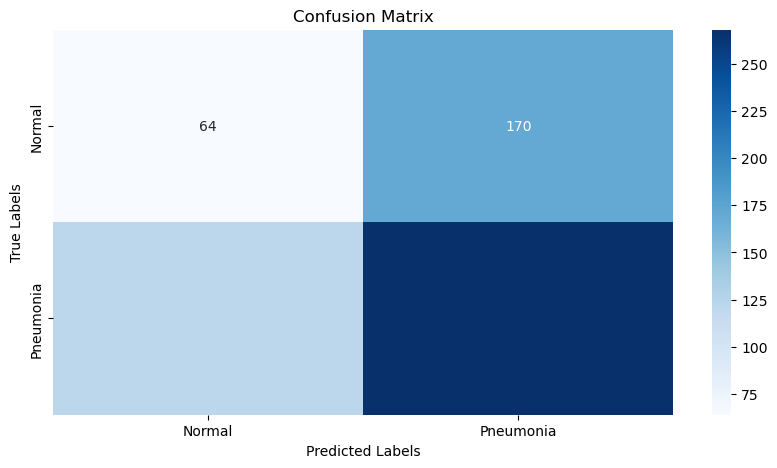

In [547]:
# Visualizing the confusion matrix
plt.figure(figsize=(10, 5))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=['Normal', 'Pneumonia'], yticklabels=['Normal', 'Pneumonia'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [548]:
# Графики precision-recall и ROC-AUC
precision, recall, _ = precision_recall_curve(y_true, y_pred_proba[:, 1])
fpr, tpr, _ = roc_curve(y_true, y_pred_proba[:, 1])

# Площадь под кривой ROC-AUC
roc_auc = auc(y_true, y_pred_proba[:, 1])

print('ROC-AUC:', roc_auc)

ROC-AUC: 0.9766787886619568


In [549]:
# Площадь под кривой ROC-AUC
roc_auc = roc_auc_score(y_true, y_pred_proba[:,1])
print('ROC-AUC:', roc_auc)

ROC-AUC: 0.48961757615603774


Text(0.5, 1.0, 'ROC Curve')

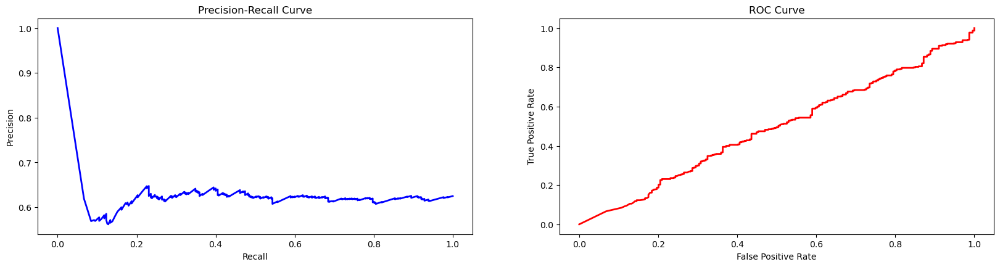

In [550]:
# Построение графиков
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.plot(recall, precision, color='blue', linewidth=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')

plt.subplot(2, 2, 2)
plt.plot(fpr, tpr, color='red', linewidth=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')